In [621]:
## Import necessary libraries
import pandas as pd
import numpy as np
import cv2
import random
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from google.colab.patches import cv2_imshow
from numpy.ma.core import resize
import seaborn as sns
from PIL import Image
plt.style.use('seaborn')
!pip install Pillow


<ipython-input-621-9b4572879a6d>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


###**4 different noises for 3 images**

In [622]:
#3 Import images and resize to 400x400
image1= cv2.imread("/content/NV1.jpg")
image2= cv2.imread("/content/V1.jpg")
image3= cv2.imread("/content/V2.jpg")
image1=cv2.resize(image1,(400,400))
image2=cv2.resize(image2,(400,400))
image3=cv2.resize(image3,(400,400))




**Original Images**

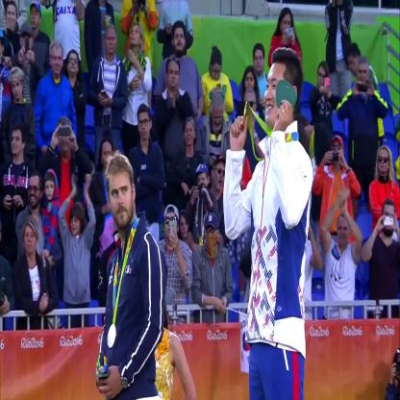

In [623]:
## Display the image1
cv2_imshow(image1)

In [624]:
mean1=np.mean(image1)
mean1

87.76601875

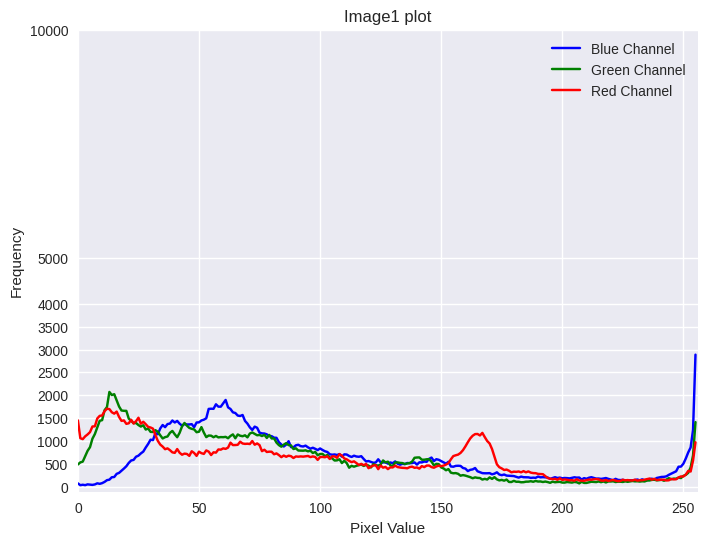

In [625]:
# Split the image into color channels
b, g, r = cv2.split(image1)

# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("Image1 plot")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

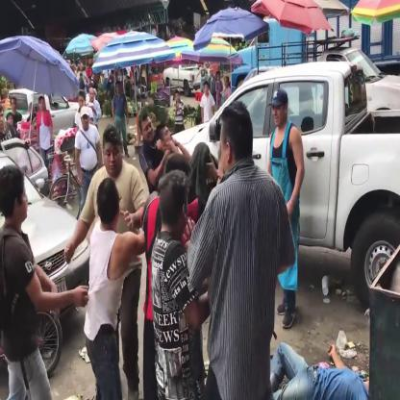

In [626]:
 cv2_imshow(image2)

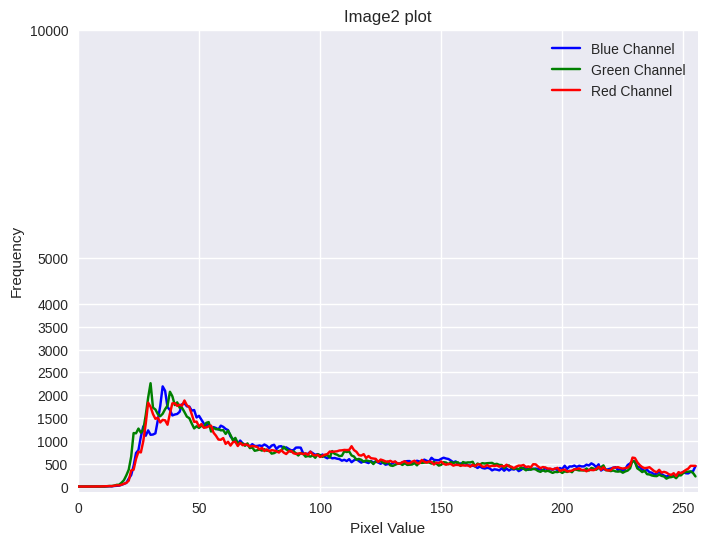

In [627]:
# Split the image into color channels
b, g, r = cv2.split(image2)

# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("Image2 plot")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

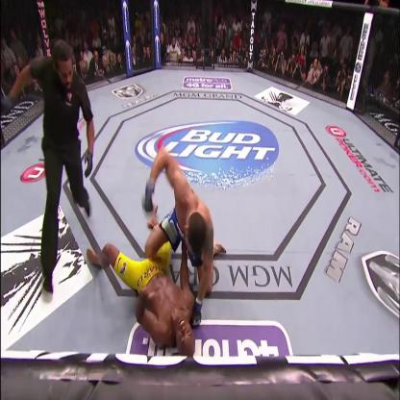

In [628]:
cv2_imshow(image3)

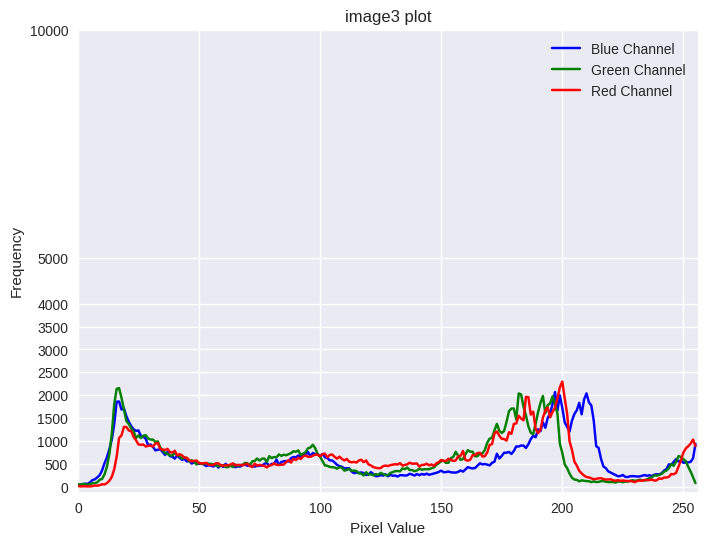

In [629]:
# Split the image into color channels
b, g, r = cv2.split(image3)

# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("image3 plot")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

**PLotting a blank image to generate noise in theb blank image.**

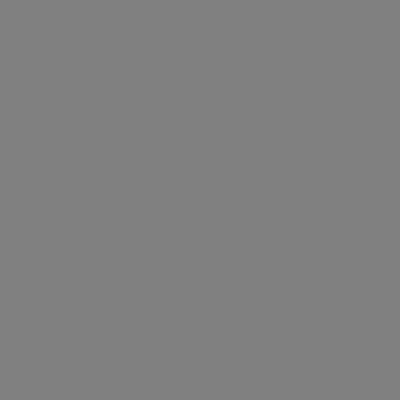

In [630]:

# Define the dimensions of the blank image
width, height = 400, 400

# Create a blank black image
blank_image = np.zeros((height, width, 3), dtype=np.uint8)
# Define the gray color (you can choose any shade of gray by adjusting these values)
gray_color = (128, 128, 128)

# Fill the entire image with gray
cv2.rectangle(blank_image, (0, 0), (width, height), gray_color, -1)

# Display
cv2_imshow(blank_image)


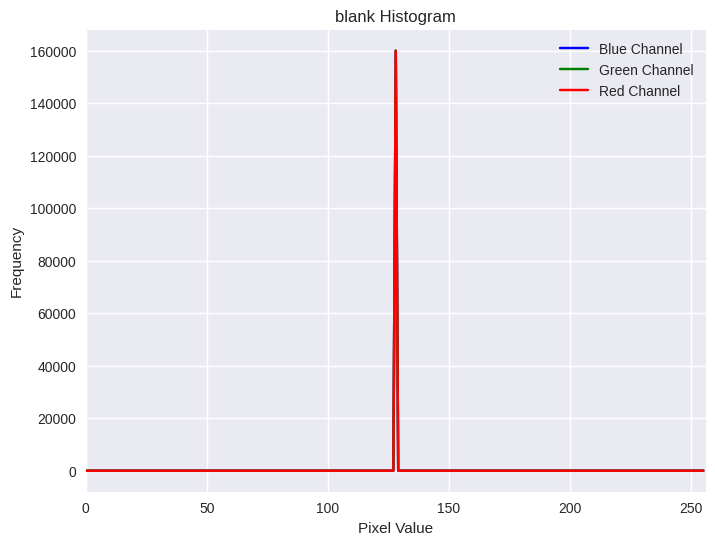

In [631]:
# Split the image into color channels
b, g, r = cv2.split(blank_image)

# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("blank Histogram")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])



plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)


plt.show()

**1) Generate and add 4 different noises (including Gaussian and salt-and-pepper (impulse)) noise to 3 images. You must be able to specify the noise mean and variance (for example =10, 0.8)**

In [632]:
## values of mean and variance
mean = 1.2
variance = 1

In [633]:
## creating Gaussian noise

In [634]:
import matplotlib.pyplot as plt
## Gaussian noise


def gaussian_noise(img, mean, variance):
    ## create gaussian noise
    g_noise = np.random.normal(mean, np.sqrt(variance), img.shape).astype(np.uint8)

    ## adding noise to the image
    noisy_image = cv2.add(img, g_noise, dtype=cv2.CV_8U)

    ## Clip values to ensure they are within the valid range [0, 255]
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)

    return noisy_image


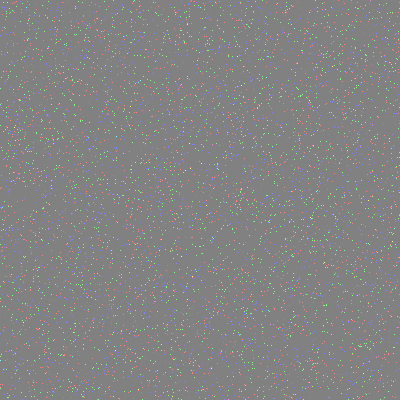

In [635]:
#3 display the gaussian noise
gausian_blank1=gaussian_noise(blank_image, mean, variance)
cv2_imshow(gausian_blank1)

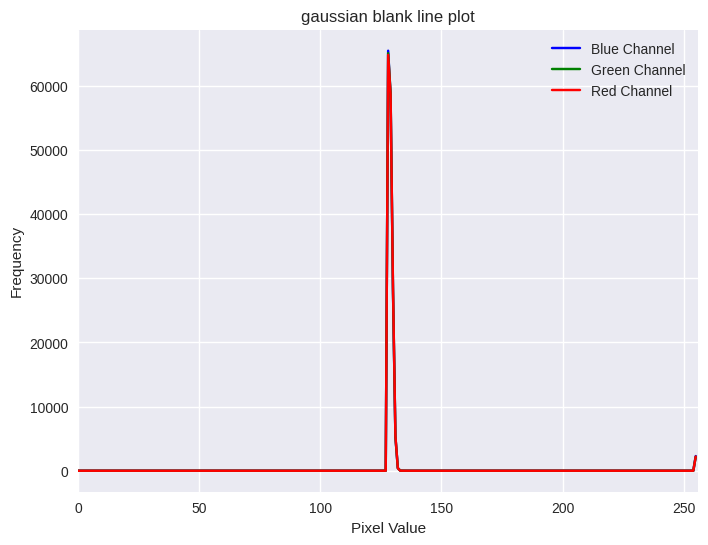

In [636]:
# Split the image into color channels
b, g, r = cv2.split(gausian_blank1)

# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("gaussian blank line plot")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])



plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)


plt.show()

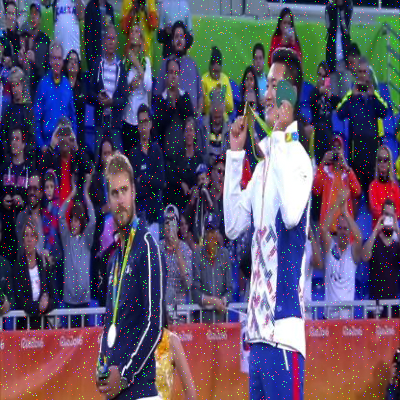

In [637]:
## for image 1
g_image1=(gaussian_noise(image1, mean, variance))
cv2_imshow(g_image1)

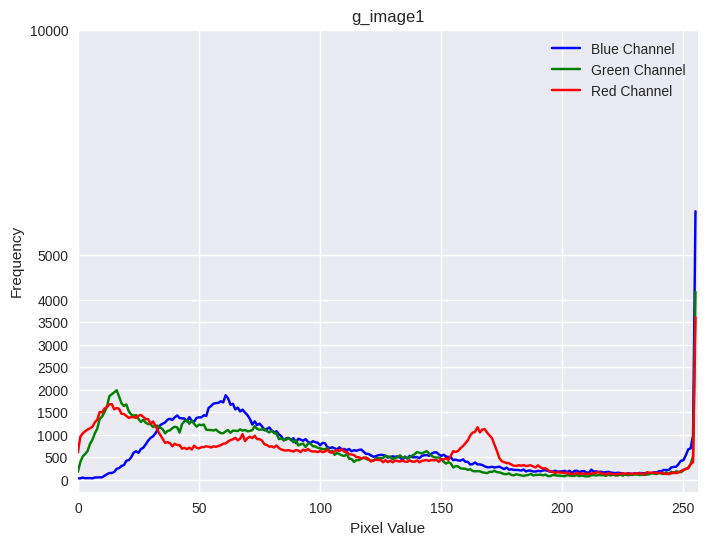

In [638]:
# Split the image into color channels
b, g, r = cv2.split(g_image1)

# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("g_image1")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

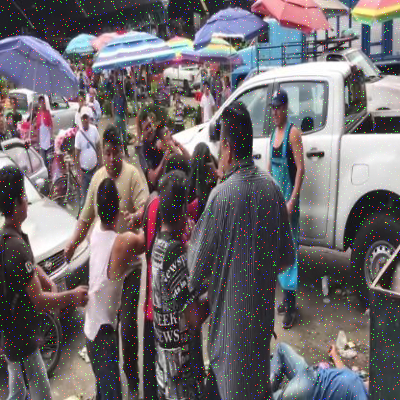

In [639]:
## for image 2
g_image2=(gaussian_noise(image2, mean, variance))
cv2_imshow(g_image2)

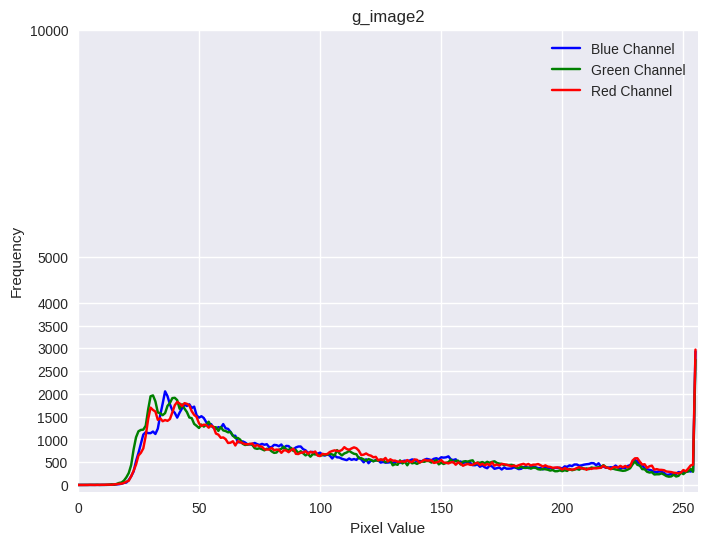

In [640]:
# Split the image into color channels
b, g, r = cv2.split(g_image2)

# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("g_image2")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

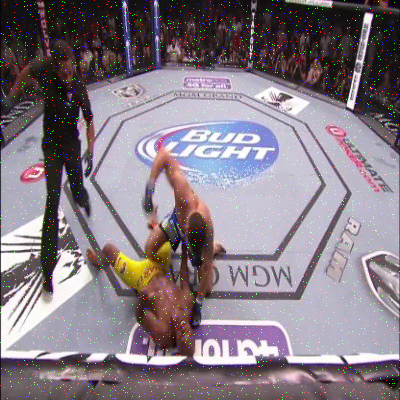

In [641]:
## for image 3
g_image3=(gaussian_noise(image3, mean, variance))
cv2_imshow(g_image3)

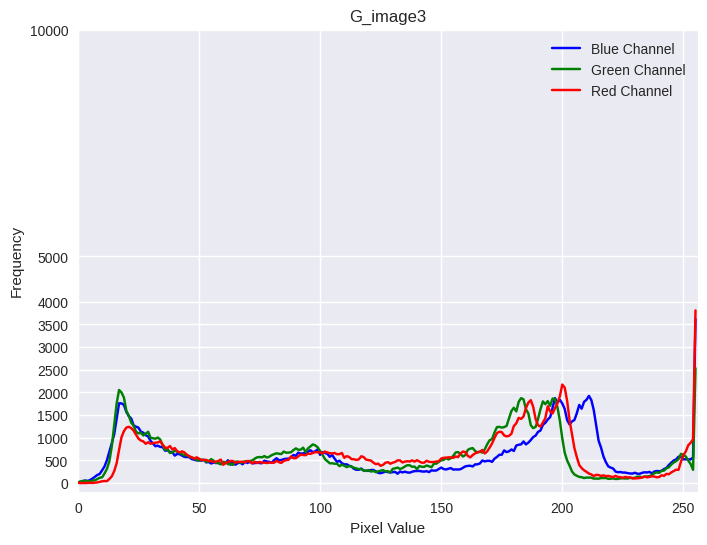

In [642]:
# Split the image into color channels
b, g, r = cv2.split(g_image3)

# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("G_image3")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

In [643]:
## Salt and Pepper Noise

In [644]:
#3 Generating salt and pepper noise
import matplotlib.pyplot as plt
salt=0.01
pepper=0.01
def salt_pepper(image,mean, variance,salt, pepper):
    noisy_image = image.copy()

    # Generate salt noise (white pixels)
    salt_mask = np.random.rand(*image.shape) < salt
    noisy_image[salt_mask] = 255

    # Generate pepper noise (black pixels)
    pepper_mask = np.random.rand(*image.shape) < pepper
    noisy_image[pepper_mask] = 0

    return noisy_image





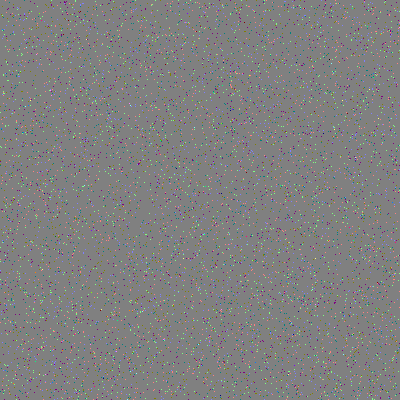

In [645]:
#3 display the impulse noise
salt_pepper_blank=(salt_pepper(blank_image,mean, variance,salt, pepper))
cv2_imshow(salt_pepper_blank)

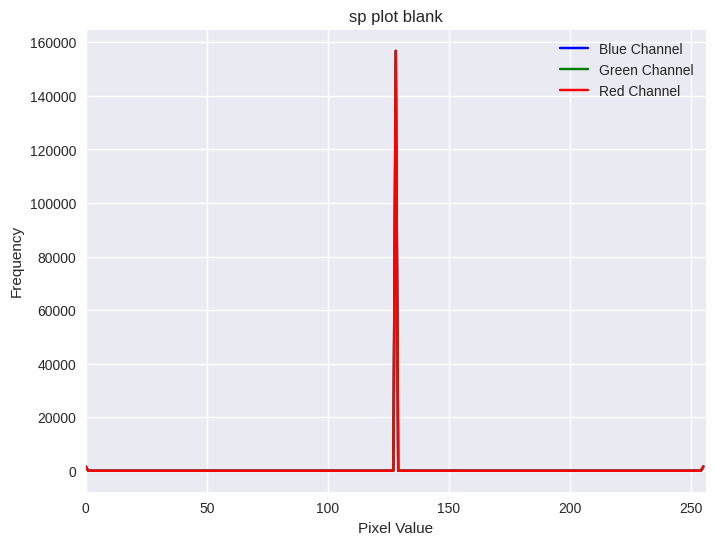

In [646]:
# Split the image into color channels
b, g, r = cv2.split(salt_pepper_blank)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("sp plot blank")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

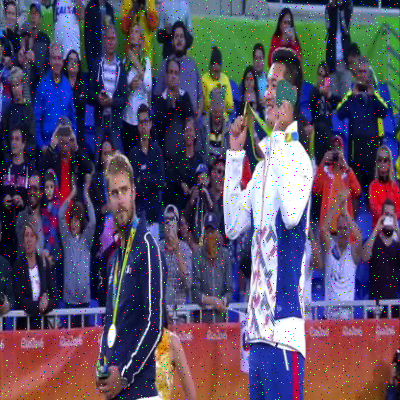

In [647]:
#3 salt and peeper noise for image 1
salt_pepper1=(salt_pepper(image1,mean, variance,salt, pepper))
cv2_imshow(salt_pepper1)


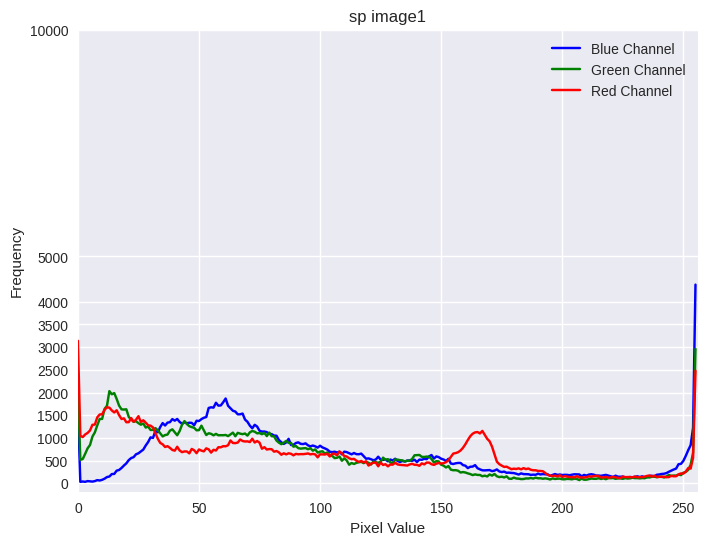

In [648]:
# Split the image into color channels
b, g, r = cv2.split(salt_pepper1)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("sp image1")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

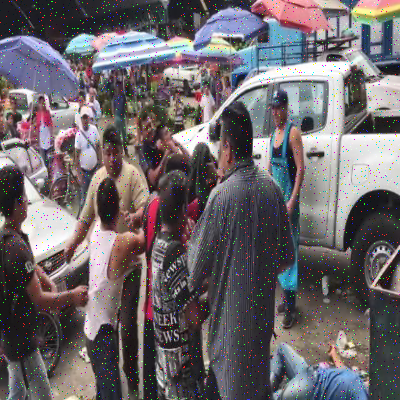

In [649]:
#3 salat and pepper noise for image 2
salt_pepper2=(salt_pepper(image2, mean, variance, salt, pepper))
cv2_imshow(salt_pepper2)

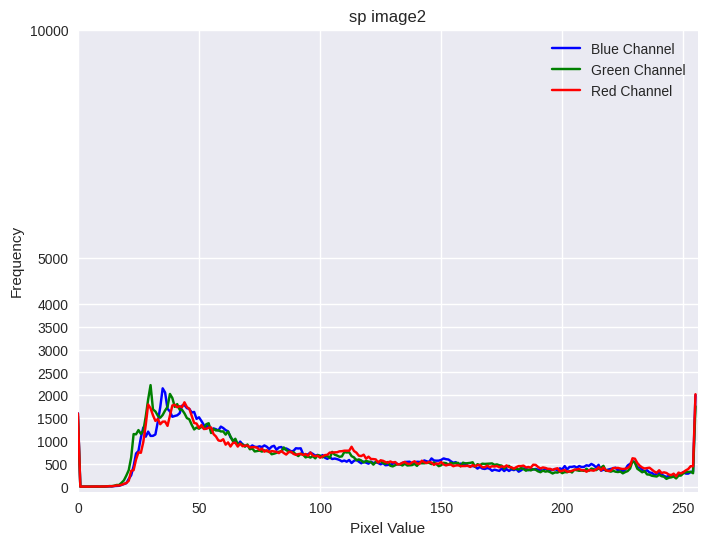

In [650]:
# Split the image into color channels
b, g, r = cv2.split(salt_pepper2)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("sp image2")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

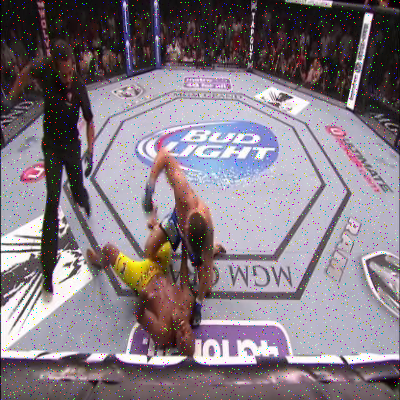

In [651]:
## salat and pepper noise for image 3
salt_pepper3=(salt_pepper(image3, mean, variance, salt, pepper))
cv2_imshow(salt_pepper3)

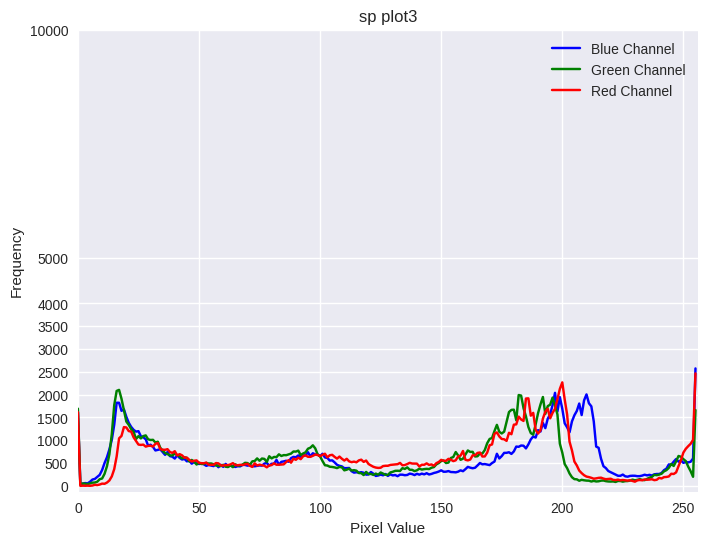

In [652]:
# Split the image into color channels
b, g, r = cv2.split(salt_pepper3)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("sp plot3")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

In [653]:
## Poisson noise

In [654]:
## generate poisson noise

import scipy.stats as stats

def poisson_noise(image, intensity):
    noisy_image = image.copy()

    # Generate Poisson noise
    noise = np.random.poisson(intensity, size=image.shape)
    noise= noise.astype(np.uint8)
    # Add Poisson noise to the image
    noisy_image += noise

    # Clip values to ensure they are within the valid range (0-255 for uint8 images)
    noisy_image = np.clip(noisy_image, 0, 255)

    return noisy_image



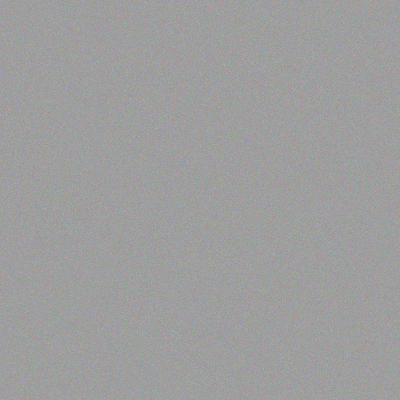

In [655]:
## display poisson noise
poi_blank=poisson_noise(blank_image, intensity=30)
cv2_imshow(poi_blank)

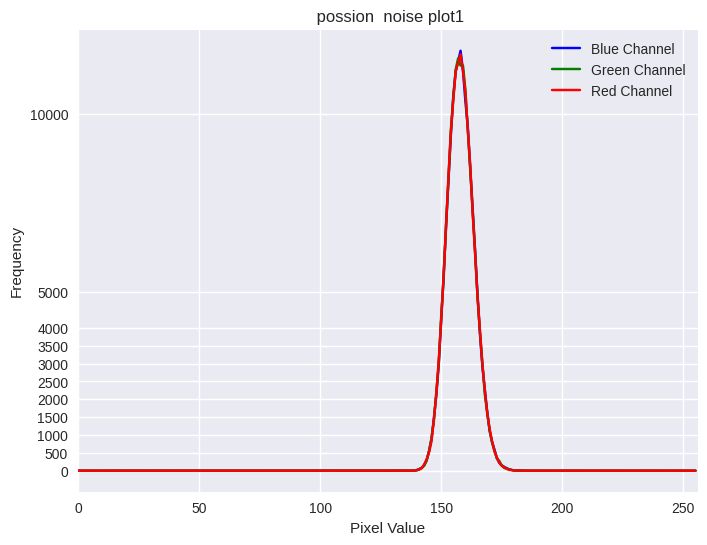

In [656]:
# Split the image into color channels
b, g, r = cv2.split(poi_blank)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" possion  noise plot1")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

when applying Poisson noise, you typically don't directly specify mean and variance like you would with Gaussian noise. Poisson noise is a statistical process that models the number of events occurring in a fixed interval of time or space, and it is characterized by a single parameter, which is often referred to as "intensity" or "lambda."

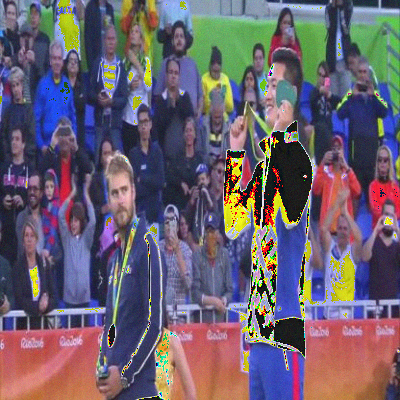

In [657]:
#3 poisson noise for image 1
poission_image1 = poisson_noise(image1, intensity=30)
cv2_imshow(poission_image1)

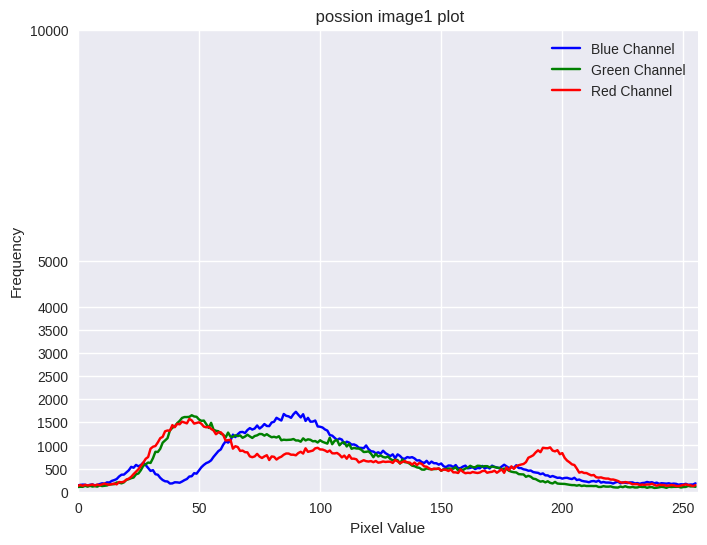

In [658]:
# Split the image into color channels
b, g, r = cv2.split(poission_image1)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" possion image1 plot")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

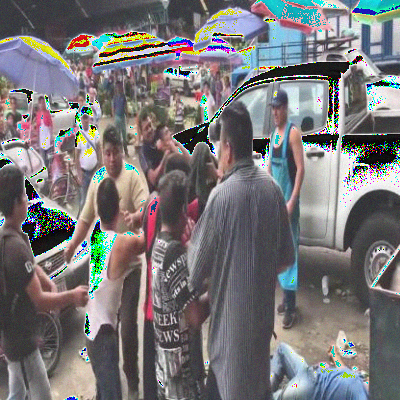

In [659]:
#3 Poisson oise for image 2
poission_image2 = poisson_noise(image2, intensity=30)
cv2_imshow(poission_image2)

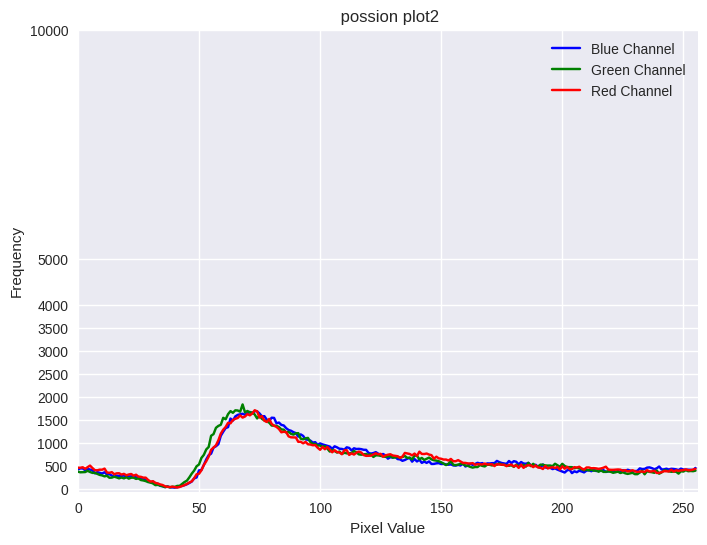

In [660]:
# Split the image into color channels
b, g, r = cv2.split(poission_image2)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" possion plot2")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

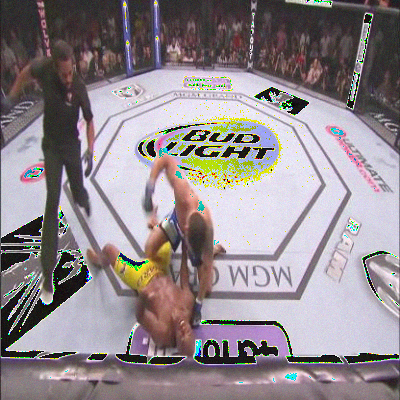

In [661]:
## poisson noise for image 3
poission_image3= poisson_noise(image3, intensity=30)
cv2_imshow(poission_image3)

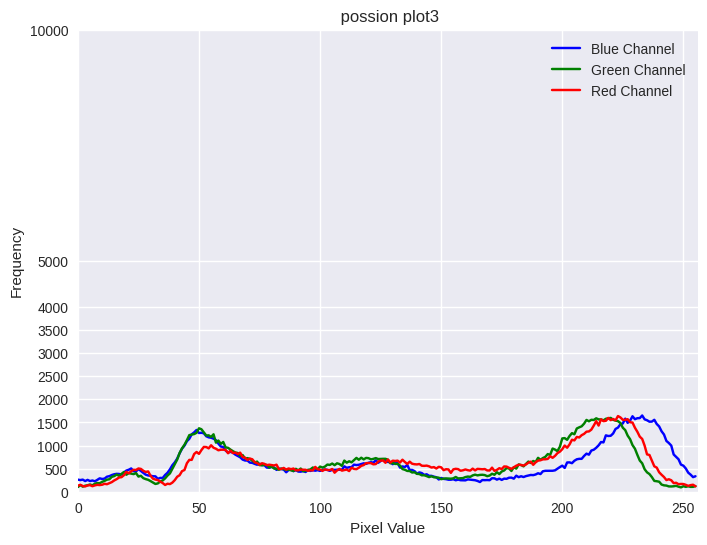

In [662]:
# Split the image into color channels
b, g, r = cv2.split(poission_image3)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" possion plot3")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

In [663]:
#3 color noise

In [664]:
## generate color noise
def color_noise(image, mean, variance, noise_level=10):
    # Generate random color noise of the same shape as the input image
    color_noise = np.random.randint(-noise_level, noise_level + 1, image.shape, dtype=np.int32)

    # Add the color noise to the input image
    noisy_image = np.clip(image.astype(np.int32) + color_noise, 0, 255).astype(np.uint8)

    return noisy_image


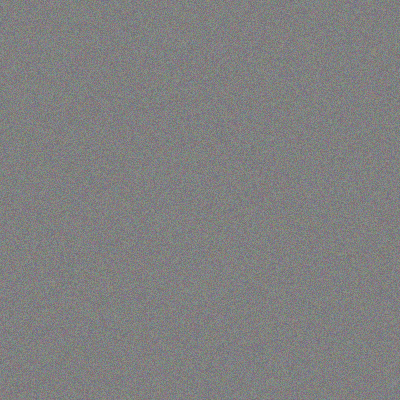

In [665]:
## display the color noise
color_blank=color_noise(blank_image, mean, variance, noise_level=20)
cv2_imshow(color_blank)

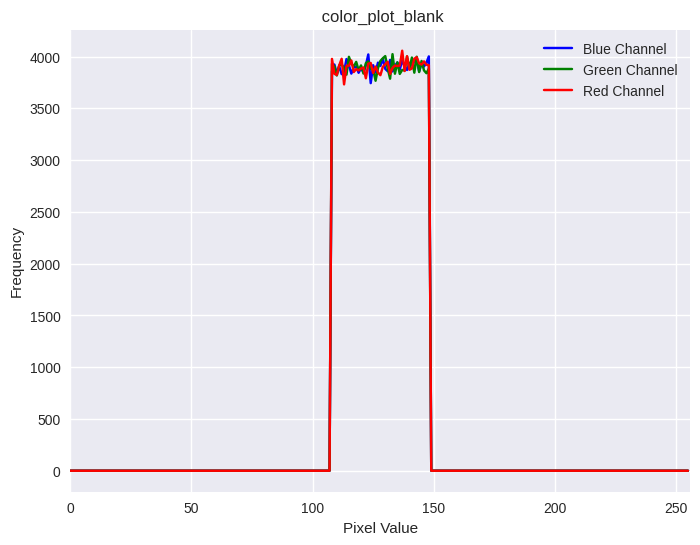

In [666]:
# Split the image into color channels
b, g, r = cv2.split(color_blank)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" color_plot_blank")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

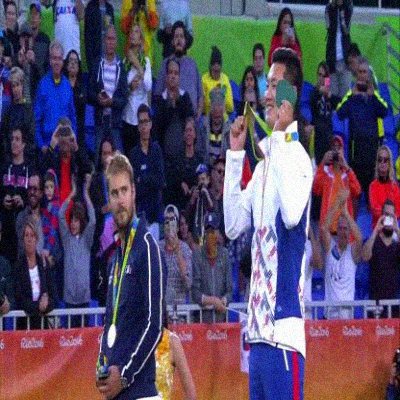

In [667]:
## color noise for image 1
color1=color_noise(image1,mean, variance, noise_level=20)
cv2_imshow(color1)

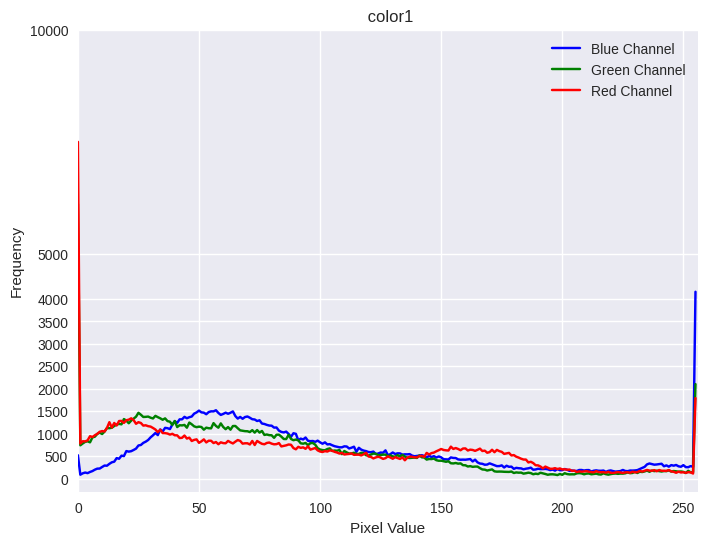

In [668]:
# Split the image into color channels
b, g, r = cv2.split(color1)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" color1")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

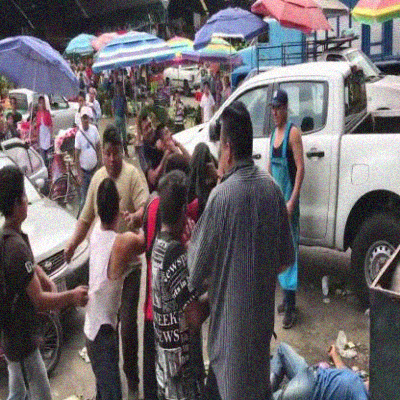

In [669]:
#3 color noise for image 2
color2=color_noise(image2,mean, variance, noise_level=20)
cv2_imshow(color2)

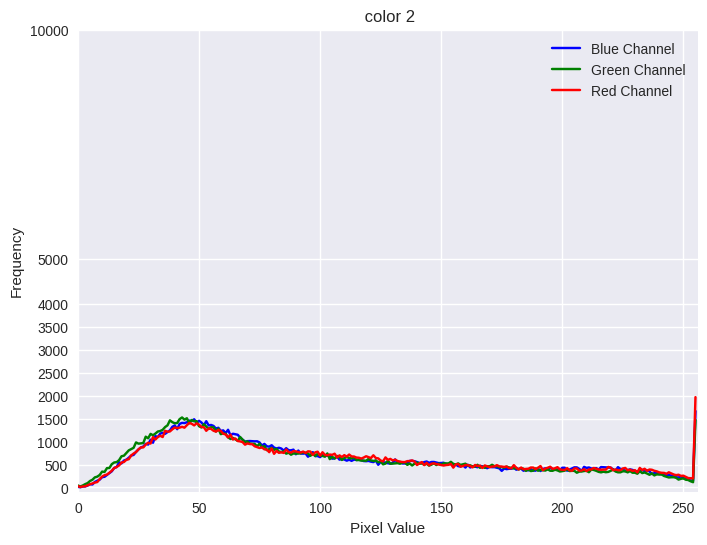

In [670]:

b, g, r = cv2.split(color2)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" color 2")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

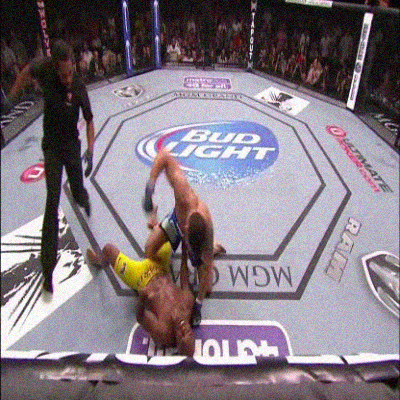

In [671]:

## color noise for image 3
color3=color_noise(image3,mean, variance, noise_level=20)
cv2_imshow(color3)

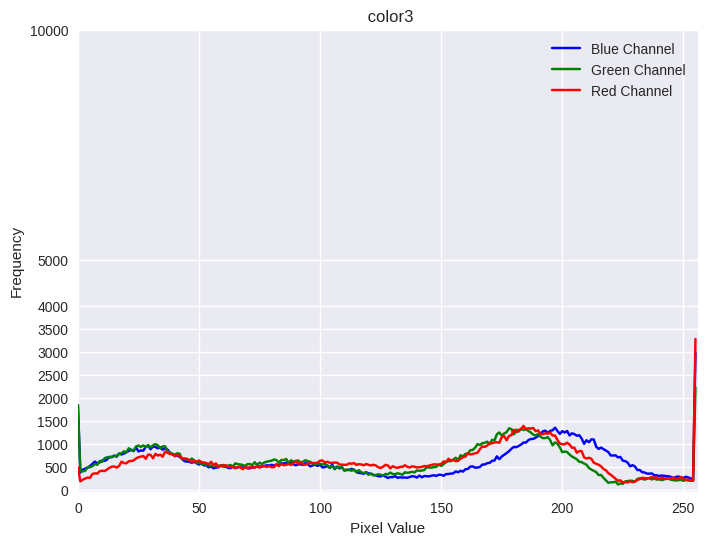

In [672]:

b, g, r = cv2.split(color3)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" color3")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])


yticks = [0, 500, 1000, 1500,2000, 2500, 3000,3500 ,4000,5000, 10000]


plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))
plt.yticks(yticks )

plt.show()

### **Estimate noise parameters from a single image**

For this part we aree taking gaussian noise image 1

In [673]:
## Taking image named 'non violence' which is first image

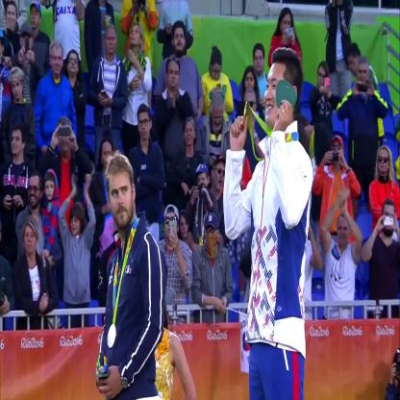

In [674]:
 #3 display image 1
 cv2_imshow(image1)

In [675]:
#3 array
image1

array([[[151, 118, 102],
        [161, 129, 114],
        [114,  82,  70],
        ...,
        [ 29,  19,   2],
        [ 26,  16,   0],
        [ 27,  17,   0]],

       [[153, 120, 104],
        [173, 140, 125],
        [126,  94,  82],
        ...,
        [ 27,  19,   2],
        [ 24,  16,   0],
        [ 25,  17,   0]],

       [[151, 118, 102],
        [182, 149, 135],
        [139, 107,  94],
        ...,
        [ 25,  18,   3],
        [ 22,  15,   0],
        [ 24,  17,   2]],

       ...,

       [[ 56,  95, 169],
        [ 71, 110, 184],
        [ 73, 112, 186],
        ...,
        [ 23,   8,  10],
        [ 24,  11,  11],
        [ 29,  17,  16]],

       [[ 53,  94, 167],
        [ 68, 109, 182],
        [ 71, 109, 183],
        ...,
        [ 22,   8,  10],
        [ 23,  11,  11],
        [ 26,  16,  16]],

       [[ 49,  92, 165],
        [ 64, 107, 180],
        [ 67, 106, 180],
        ...,
        [ 19,   6,   8],
        [ 21,   9,   9],
        [ 23,  13,  13]]

In [676]:
# Calculate the mean and variance of the original image
meanx = np.mean(image1)
variancex = np.var(image1)

# Display the mean and variance
print("Mean:", meanx)
print("Variance:", variancex)

Mean: 87.76601875
Variance: 4095.838392357981


In [677]:
## Original POI of the image

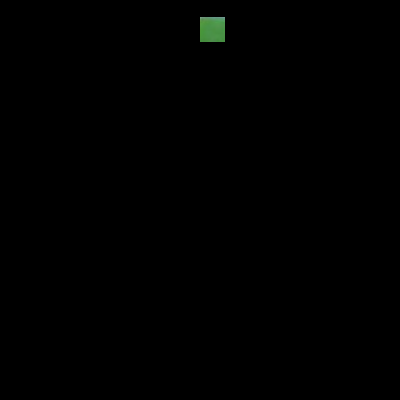

In [678]:
# Define the coordinates and dimensions of the square for the POI
x, y, width, height = 200, 17, 25, 25
# Create a mask with the same dimensions as the image
mask = np.zeros_like(image1)

# Set the region outside the square to black (0, 0, 0)
mask[:, :] = (0, 0, 0)

# Set the region inside the square to white (100, 100, 100)
mask[y:y+height, x:x+width] = (255, 255, 255)

# Apply the mask to the original image
result11 = cv2.bitwise_and(image1, mask)


# Display the resulting image
cv2_imshow(result11)

In [679]:
## write an image named POI.jpg to only save POI area as an image.
cv2.imwrite("OriginalPOI.jpg", result11[y:y+height, x:x+width])
originalPOI_image=cv2.imread("OriginalPOI.jpg")
## display the pixel matrix of the POI
originalPOI_image

array([[[128, 163, 119],
        [120, 155, 111],
        [115, 152, 106],
        ...,
        [133, 153, 106],
        [135, 155, 108],
        [138, 156, 109]],

       [[118, 160, 113],
        [109, 151, 104],
        [103, 145,  98],
        ...,
        [121, 149,  96],
        [123, 151,  98],
        [126, 152,  99]],

       [[ 99, 152, 102],
        [ 89, 145,  94],
        [ 84, 140,  89],
        ...,
        [109, 152,  89],
        [112, 153,  92],
        [115, 156,  95]],

       ...,

       [[ 62, 143,  70],
        [ 61, 142,  69],
        [ 60, 141,  68],
        ...,
        [ 66, 142,  70],
        [ 66, 142,  70],
        [ 67, 143,  71]],

       [[ 64, 143,  70],
        [ 61, 142,  69],
        [ 61, 142,  69],
        ...,
        [ 66, 142,  70],
        [ 66, 142,  70],
        [ 67, 143,  71]],

       [[ 66, 142,  70],
        [ 63, 142,  69],
        [ 63, 142,  69],
        ...,
        [ 67, 143,  71],
        [ 66, 142,  70],
        [ 67, 143,  71]]

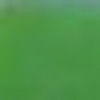

In [680]:
# Define the zoom factor (e.g., 2x zoom)
zoom_factor = 4

# Resize the image to zoom in
ozoomed_image = cv2.resize(originalPOI_image, None, fx=zoom_factor, fy=zoom_factor, interpolation=cv2.INTER_LINEAR)
cv2_imshow(ozoomed_image)

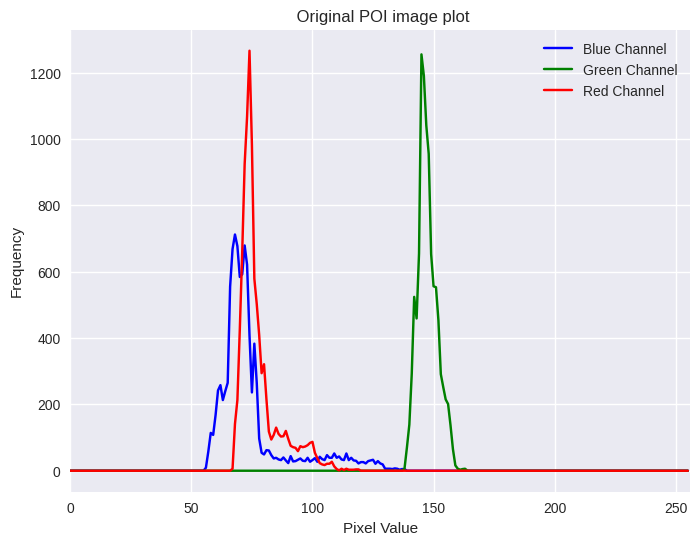

In [681]:
b, g, r = cv2.split(ozoomed_image)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" Original POI image plot")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [682]:
## Mean and Variance before noise for point of interest

In [683]:
# Calculate the mean and variance of the POI for original image without noise
mean = np.mean(ozoomed_image)
variance = np.var(ozoomed_image)

# Display the mean and variance
print("Mean:", mean)
print("Variance:", variance)

Mean: 100.1519
Variance: 1226.5075597233335


In [684]:
## NoIse Image

In [685]:
g_image1

array([[[151, 119, 103],
        [161, 130, 115],
        [114,  83,  71],
        ...,
        [ 32,  20,   3],
        [ 27,  17,   2],
        [ 28,  18,   0]],

       [[153, 120, 105],
        [175, 140, 125],
        [127,  94,  82],
        ...,
        [ 28,  20, 255],
        [ 25,  16,   1],
        [ 26,  19,   1]],

       [[151, 118, 103],
        [182, 151, 135],
        [142, 108,  95],
        ...,
        [ 27,  18,   4],
        [255,  16,   2],
        [ 26,  18,   4]],

       ...,

       [[ 58,  95, 170],
        [ 71, 110, 185],
        [ 74, 113, 186],
        ...,
        [ 24,   8,  10],
        [ 25,  11,  13],
        [ 30,  19,  17]],

       [[ 54,  97, 167],
        [ 69, 109, 183],
        [ 72, 110, 184],
        ...,
        [ 23,   9,  10],
        [ 24,  12,  12],
        [ 26,  17,  16]],

       [[ 50,  93, 166],
        [ 64, 107, 180],
        [ 67, 107, 180],
        ...,
        [ 20,   6,   8],
        [ 22,   9,  10],
        [ 23,  13,  14]]

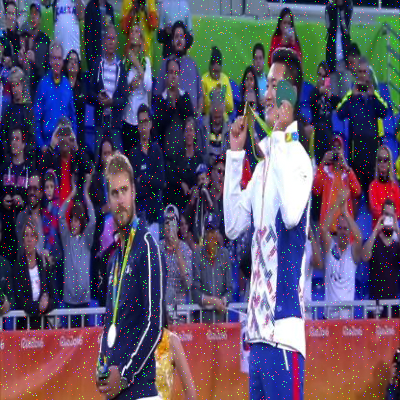

In [686]:
#3 display noise image
cv2_imshow(g_image1)

In [687]:
## POI with gaussian noise

The full image with POI got gausian noise NV1.jpg



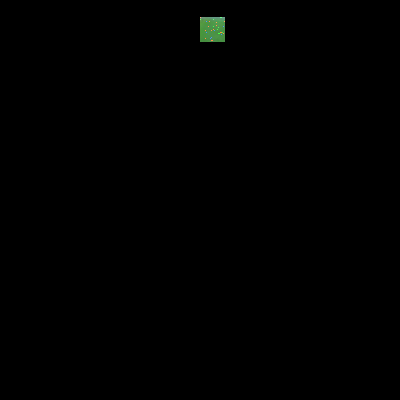

In [688]:
# Define the coordinates and dimensions of the square for the POI
x, y, width, height = 200, 17, 25, 25  # Example values, adjust as needed

# Create a mask with the same dimensions as the image
mask = np.zeros_like(g_image1)

# Set the region outside the square to black (0, 0, 0)
mask[:, :] = (0, 0, 0)

# Set the region inside the square to white (100, 100, 100)
mask[y:y+height, x:x+width] = (255, 255, 255)

# Apply the mask to the original image
result = cv2.bitwise_and(g_image1, mask)
## Plotting the complete image with point of interest
print("The full image with POI got gausian noise NV1.jpg\n")
cv2_imshow(result)




In [689]:
## write an image named POI.jpg to only save POI area as an image.
cv2.imwrite("POI.jpg", result[y:y+height, x:x+width])
POI_image=cv2.imread("POI.jpg")
## display the pixel matrix
POI_image


array([[[153, 193, 181],
        [112, 148, 131],
        [118, 147, 121],
        ...,
        [133, 157,  99],
        [145, 156, 110],
        [145, 158, 106]],

       [[105, 157, 127],
        [ 99, 146, 113],
        [ 99, 140, 102],
        ...,
        [118, 152,  91],
        [127, 150,  98],
        [128, 152,  98]],

       [[148, 223, 155],
        [ 78, 150,  84],
        [ 83, 147,  88],
        ...,
        [102, 156,  89],
        [109, 160, 100],
        [112, 156,  97]],

       ...,

       [[ 63, 147,  65],
        [ 61, 143,  66],
        [ 59, 139,  74],
        ...,
        [ 70, 144,  72],
        [ 62, 138,  66],
        [ 66, 145,  71]],

       [[ 62, 146,  64],
        [ 63, 145,  68],
        [ 60, 139,  72],
        ...,
        [ 67, 140,  70],
        [ 68, 144,  73],
        [ 67, 144,  70]],

       [[ 63, 146,  71],
        [ 62, 144,  69],
        [ 62, 143,  70],
        ...,
        [ 69, 145,  73],
        [ 67, 143,  71],
        [ 70, 144,  72]]

The point of interest image is displayed below:(25x25)



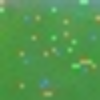

In [690]:
# Define the zoom factor (e.g., 2x zoom)
zoom_factor = 4

# Resize the image to zoom in
zoomed_image = cv2.resize(POI_image, None, fx=zoom_factor, fy=zoom_factor, interpolation=cv2.INTER_LINEAR)

print("The point of interest image is displayed below:(25x25)\n")
cv2_imshow(zoomed_image)

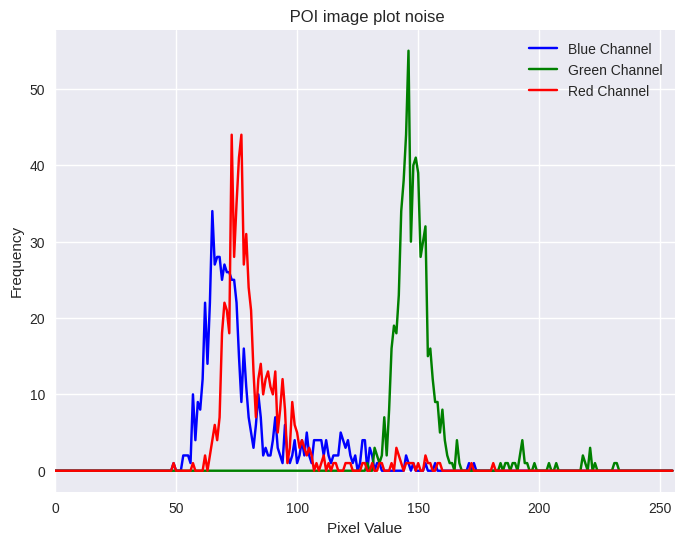

In [691]:

b, g, r = cv2.split(POI_image)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" POI image plot noise")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [692]:
## Mean and Variance for Noised image

In [693]:
# Calculate the mean and variance of the POI after noise
meanP = np.mean(POI_image)
varianceP = np.var(POI_image)

# Display the mean and variance
print("Mean:", meanP)
print("Variance:", varianceP)

Mean: 103.776
Variance: 1342.0682239999999


### **Apply a class of Mean denoising**

Lets take image 1 from Gaussian noise

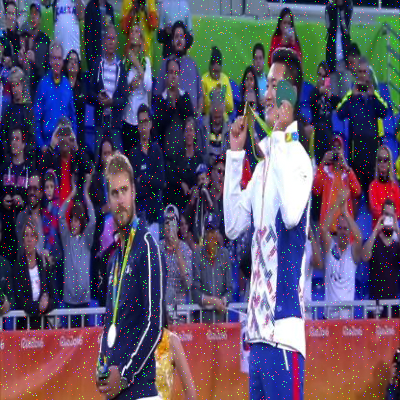

In [694]:
## noise image 1
cv2_imshow(g_image1)

In [695]:
## array
g_image1

array([[[151, 119, 103],
        [161, 130, 115],
        [114,  83,  71],
        ...,
        [ 32,  20,   3],
        [ 27,  17,   2],
        [ 28,  18,   0]],

       [[153, 120, 105],
        [175, 140, 125],
        [127,  94,  82],
        ...,
        [ 28,  20, 255],
        [ 25,  16,   1],
        [ 26,  19,   1]],

       [[151, 118, 103],
        [182, 151, 135],
        [142, 108,  95],
        ...,
        [ 27,  18,   4],
        [255,  16,   2],
        [ 26,  18,   4]],

       ...,

       [[ 58,  95, 170],
        [ 71, 110, 185],
        [ 74, 113, 186],
        ...,
        [ 24,   8,  10],
        [ 25,  11,  13],
        [ 30,  19,  17]],

       [[ 54,  97, 167],
        [ 69, 109, 183],
        [ 72, 110, 184],
        ...,
        [ 23,   9,  10],
        [ 24,  12,  12],
        [ 26,  17,  16]],

       [[ 50,  93, 166],
        [ 64, 107, 180],
        [ 67, 107, 180],
        ...,
        [ 20,   6,   8],
        [ 22,   9,  10],
        [ 23,  13,  14]]

In [696]:
# Calculate the mean and variance of the gaussian noise image 1
mean1 = np.mean(g_image1)
variance1 = np.var(g_image1)

# Display the mean and variance
print("Mean:", mean1)
print("Variance:", variance1)

Mean: 90.93414166666666
Variance: 4419.882458513264


In [697]:
!pip install Pillow

## **Applying Various Mean**

In [698]:
## Arethmetic mean for gaussian image 1

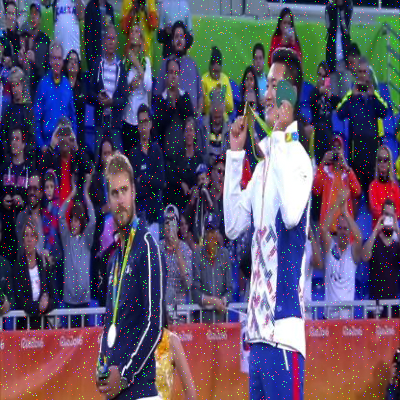

In [699]:
## noise image 1
cv2_imshow(g_image1)

In [700]:
## Create an output image for Arethmetic Mean
kernel_size=(3,3)
denoised_gaussian_image1= np.copy(g_image1)

In [701]:
## Use of loop to iterate over neighbourhooda nd apply arethmetic meanfilter
for y in range(1,g_image1.shape[0]-1):
  for x in range(1, g_image1.shape[1]-1):
    for channel in range(3):
    ## extracte the neighbourhood
        neighborhood= g_image1[y - 1:y + 2, x - 1:x + 2, channel]
        ## calculate the mean for neighboorhood
        mean_value = int(np.mean(neighborhood))
        ## update the pixel values in output image
        denoised_gaussian_image1[y, x, channel]= mean_value


In [702]:
neighborhood

array([[10, 13, 17],
       [10, 12, 16],
       [ 8, 10, 14]], dtype=uint8)

In [703]:
## diplay the AM mean value
mean_value

12

In [704]:

## write timage
cv2.imwrite("dN.jpg", denoised_gaussian_image1)

True

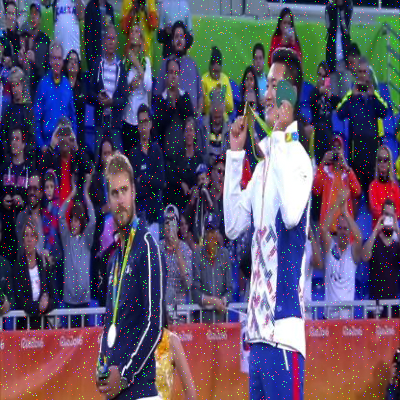

In [705]:
## display gaussian image 1
cv2_imshow(g_image1)

In [706]:
# Calculate the mean and variance
meanP = np.mean(g_image1)
varianceP = np.var(g_image1)
mediand = np.median(denoised_gaussian_image1)

# Display the mean and variance
print("Mean:", meanP)
print("Variance:", varianceP)
print("median",mediand)

Mean: 90.93414166666666
Variance: 4419.882458513264
median 76.0


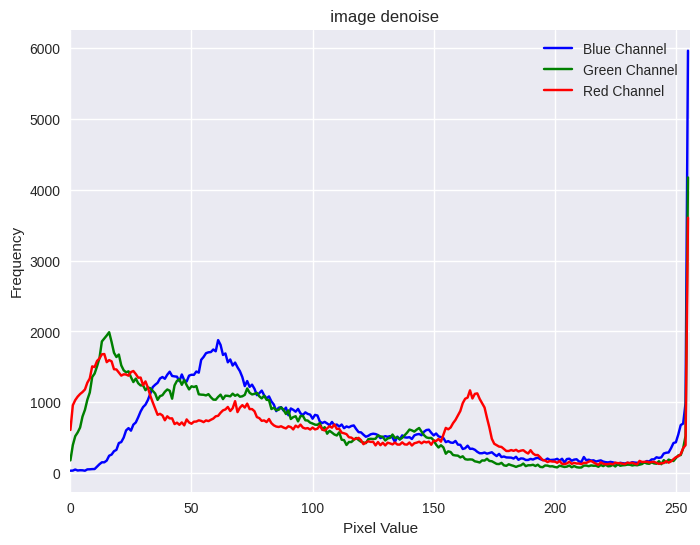

In [707]:
b, g, r = cv2.split(g_image1)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("  image denoise")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

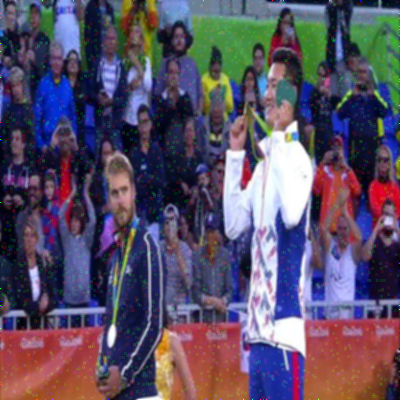

In [708]:
## display denoised gaussian image1
cv2_imshow(denoised_gaussian_image1)

In [709]:
# Calculate the mean and variance of denoised gaussian
meanm = np.mean(denoised_gaussian_image1)
variancem = np.var(denoised_gaussian_image1)
median = np.median(denoised_gaussian_image1)

# Display the mean and variance
print("Mean:", meanm)
print("Variance:", variancem)
print("median", median)

Mean: 90.48911458333333
Variance: 3779.0397231743714
median 76.0


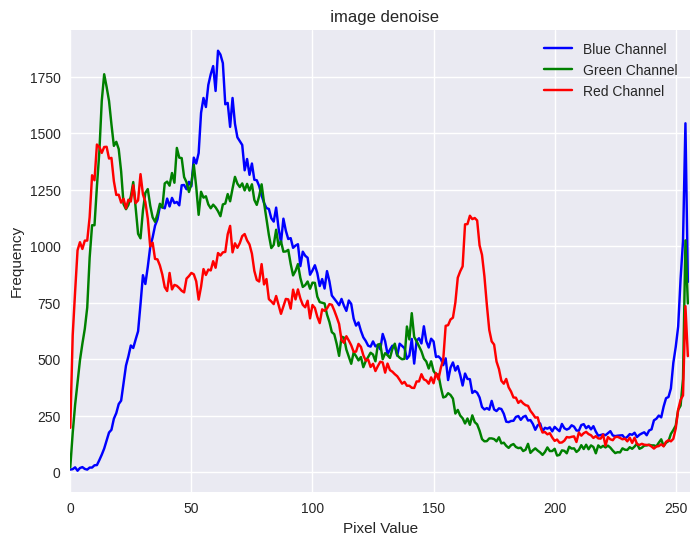

In [710]:
b, g, r = cv2.split(denoised_gaussian_image1)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("  image denoise")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [711]:
## Weighted MEan for denoised

In [712]:
## define the kernel of size(3,3)
kernel = np.array([[1, 1, 1],
                  [1, 1, 1],
                  [1, 1, 1]])
weighted_output= np.copy(g_image1)

## pad the image to handle border pixels
padded_image = cv2.copyMakeBorder(g_image1, 1, 1, 1, 1, cv2.BORDER_CONSTANT, value=(0, 0, 0))


In [713]:

# Iterate through the image to apply the weighted mean filter
for y in range(1, g_image1.shape[0] + 1):
    for x in range(1, g_image1.shape[1] + 1):
        for channel in range(3):
            neighborhood = padded_image[y - 1:y + 2, x - 1:x + 2, channel]
            weighted_mean_value = np.sum(neighborhood * kernel) / np.sum(kernel)
            weighted_output[y - 1, x - 1, channel] = int(weighted_mean_value)

In [714]:
neighborhood

array([[12, 16,  0],
       [10, 14,  0],
       [ 0,  0,  0]], dtype=uint8)

In [715]:
## weighted mean
weighted_mean_value

5.777777777777778

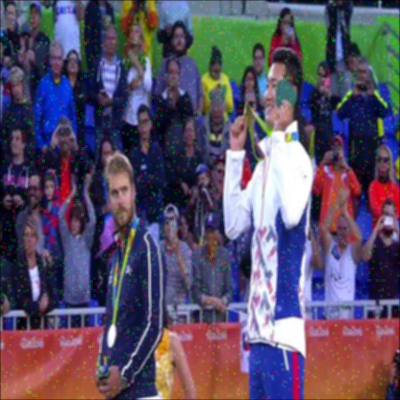

In [716]:
## weighted mean denoised output
cv2_imshow(weighted_output)

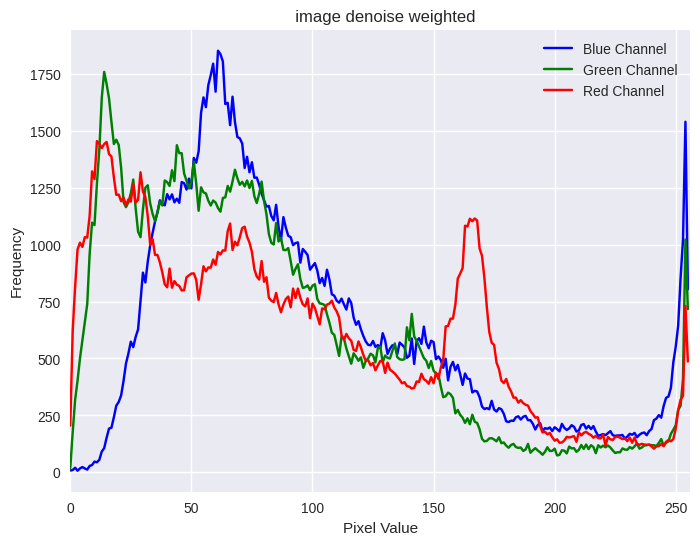

In [717]:
b, g, r = cv2.split(weighted_output)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("  image denoise weighted")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [718]:
# Calculate the mean and variance of weighted denoised
meanw = np.mean(weighted_output)
variancew = np.var(weighted_output)
median_w=np.median(weighted_output)

# Display the mean and variance
print("Mean:", meanw)
print("Variance:", variancew)
print("median",median_w)

Mean: 90.22485625
Variance: 3768.4234500835028
median 76.0


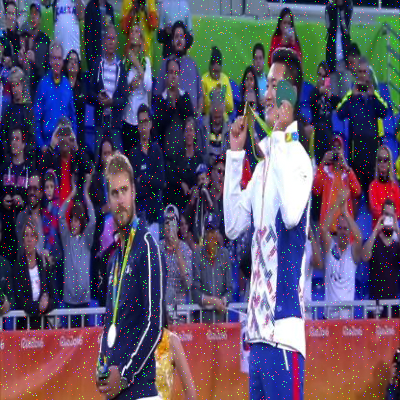

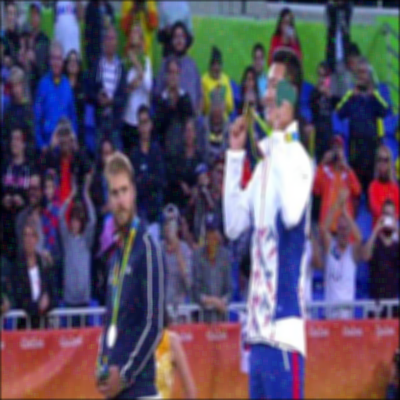

In [719]:
# Define a 5x5 kernel for the weighted mean filter
kernel = np.array([[1, 1, 1, 1, 1],
                  [1, 1, 1, 1, 1],
                  [1, 1, 1, 1, 1],
                  [1, 1, 1, 1, 1],
                  [1, 1, 1, 1, 1]])

# Create an empty output image with the same dimensions as the input image
output_image = np.copy(g_image1)

# Pad the image to handle border pixels
padded_image = cv2.copyMakeBorder(g_image1, 2, 2, 2, 2, cv2.BORDER_CONSTANT, value=(0, 0, 0))

# Iterate through the image to apply the weighted mean filter
for y in range(2, g_image1.shape[0] + 2):
    for x in range(2, g_image1.shape[1] + 2):
        for channel in range(3):  # 0 for Blue, 1 for Green, 2 for Red
            neighborhood = padded_image[y - 2:y + 3, x - 2:x + 3, channel]
            weighted_mean_value = np.sum(neighborhood * kernel) / np.sum(kernel)
            output_image[y - 2, x - 2, channel] = int(weighted_mean_value)

# Display the original and weighted mean filtered color images
cv2_imshow( g_image1)
cv2_imshow( output_image)

In [720]:
 weighted_mean_value

4.4

In [721]:
 neighborhood

array([[10, 13, 17,  0,  0],
       [10, 12, 16,  0,  0],
       [ 8, 10, 14,  0,  0],
       [ 0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0]], dtype=uint8)

In [722]:
## geometric mean

In [723]:
g_image1

array([[[151, 119, 103],
        [161, 130, 115],
        [114,  83,  71],
        ...,
        [ 32,  20,   3],
        [ 27,  17,   2],
        [ 28,  18,   0]],

       [[153, 120, 105],
        [175, 140, 125],
        [127,  94,  82],
        ...,
        [ 28,  20, 255],
        [ 25,  16,   1],
        [ 26,  19,   1]],

       [[151, 118, 103],
        [182, 151, 135],
        [142, 108,  95],
        ...,
        [ 27,  18,   4],
        [255,  16,   2],
        [ 26,  18,   4]],

       ...,

       [[ 58,  95, 170],
        [ 71, 110, 185],
        [ 74, 113, 186],
        ...,
        [ 24,   8,  10],
        [ 25,  11,  13],
        [ 30,  19,  17]],

       [[ 54,  97, 167],
        [ 69, 109, 183],
        [ 72, 110, 184],
        ...,
        [ 23,   9,  10],
        [ 24,  12,  12],
        [ 26,  17,  16]],

       [[ 50,  93, 166],
        [ 64, 107, 180],
        [ 67, 107, 180],
        ...,
        [ 20,   6,   8],
        [ 22,   9,  10],
        [ 23,  13,  14]]

In [724]:
## Geometric mean denoised

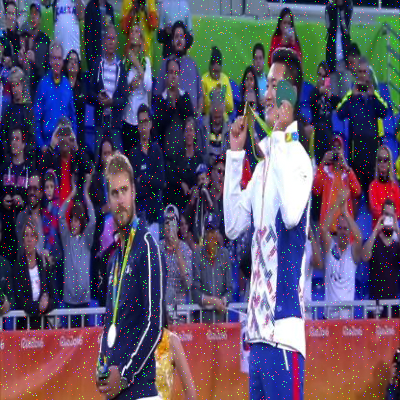

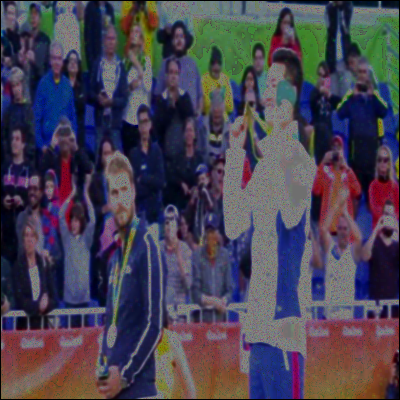

In [725]:
# Define the kernel size for the geometric mean filter
kernel_size = 3  # 3x3 kernel

# Create an empty output image with the same dimensions as the input image
gdenoised_image = np.copy(g_image1)

# Pad the image to handle border pixels
padded_image = cv2.copyMakeBorder(g_image1, 1, 1, 1, 1, cv2.BORDER_CONSTANT, value=(0, 0, 0))

# Iterate through the image to apply the geometric mean filter to each color channel
for y in range(1, g_image1.shape[0] + 1):
    for x in range(1, g_image1.shape[1] + 1):
        for channel in range(3):  # 0 for Blue, 1 for Green, 2 for Red
            neighborhood1 = padded_image[y - 1:y + 2, x - 1:x + 2, channel]
            product = np.prod(neighborhood1)
            gdenoised_image[y - 1, x - 1, channel] = int(np.power(product, 1 / (kernel_size ** 2)))

# Display the original and geometric mean denoised color images
cv2_imshow(g_image1)
cv2_imshow(gdenoised_image)





In [726]:
neighborhood1

array([[12, 16,  0],
       [10, 14,  0],
       [ 0,  0,  0]], dtype=uint8)

In [727]:
## GM value
product

0

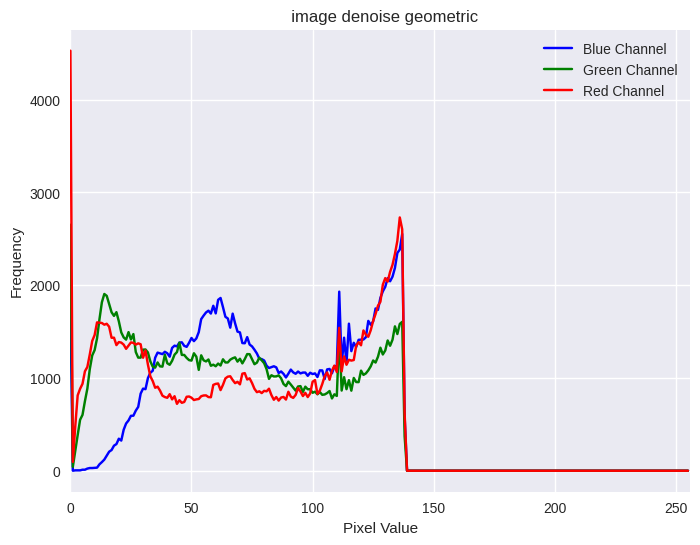

In [728]:
## plot Geometric denoised image
b, g, r = cv2.split(gdenoised_image)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title("  image denoise geometric")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [729]:
# Calculate the mean and variance of denoised geometric image
meang = np.mean(gdenoised_image)
varianceg = np.var(gdenoised_image)
median_g=np.median(gdenoised_image)

# Display the mean and variance
print("Mean:", meang)
print("Variance:", varianceg)
print("median",median_g)

Mean: 73.65298125
Variance: 1677.323059237148
median 72.0


In [730]:
##Harmonic mean filter

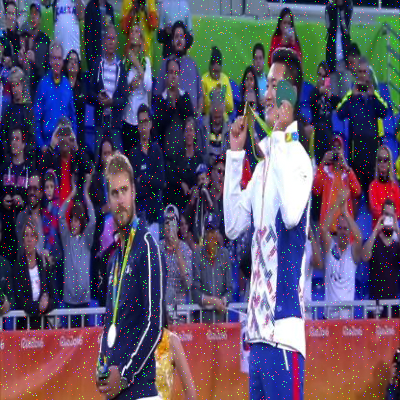

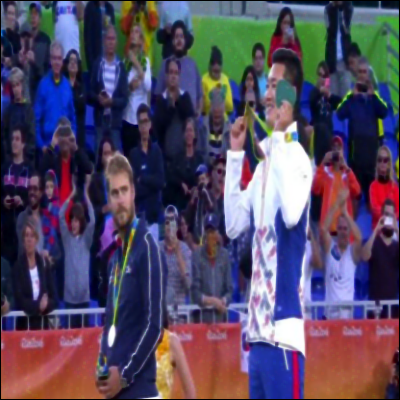

In [731]:
# Define the kernel size for the harmonic mean filter
kernel_size = 3  # 3x3 kernel for illustration, you can adjust this

# Create an empty output image with the same dimensions as the input image
hdenoised_image = np.copy(g_image1)

# Pad the image to handle border pixels
padded_image = cv2.copyMakeBorder(g_image1, 1, 1, 1, 1, cv2.BORDER_CONSTANT, value=(0, 0,0))

# Iterate through the image to apply the harmonic mean filter
for y in range(1, g_image1.shape[0] + 1):
    for x in range(1, g_image1.shape[1] + 1):
        for channel in range(3):
            neighborhood = padded_image[y - 1:y + 2, x - 1:x + 2, channel]
            # Avoid division by zero by adding a small constant (epsilon)
            harmonic_mean_value = (kernel_size ** 2) / np.sum(1 / (neighborhood + 1e-6))
            hdenoised_image[y - 1, x - 1, channel] = int(harmonic_mean_value)

# Display the original and harmonic mean denoised grayscale images
cv2_imshow(g_image1)
cv2_imshow(hdenoised_image)

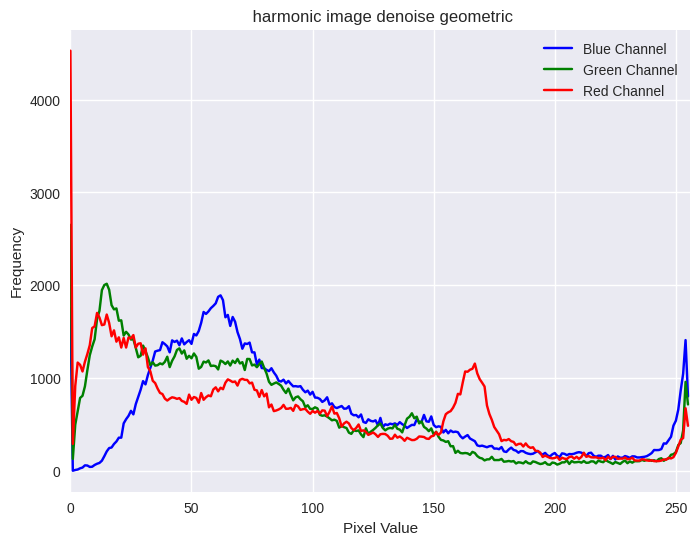

In [732]:
b, g, r = cv2.split(hdenoised_image)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" harmonic image denoise geometric")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [733]:
# Calculate the mean and variance of the harmonic denoised image
meanh = np.mean(hdenoised_image)
varianceh = np.var(hdenoised_image)
median_h=np.median(hdenoised_image)

# Display the mean and variance
print("Mean:", meanh)
print("Variance:", varianceh)
print("median",median_h)

Mean: 84.88534166666666
Variance: 3918.0935867999306
median 70.0


In [734]:
## harmonic mean value
harmonic_mean_value

1.799999885785731e-06

In [735]:
## Mean filter


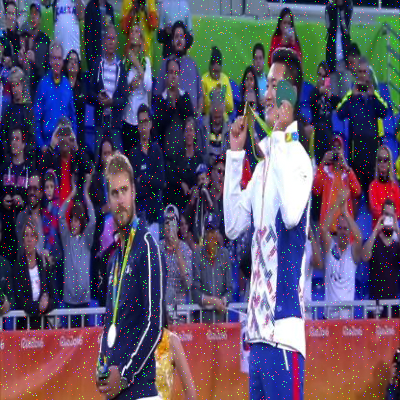

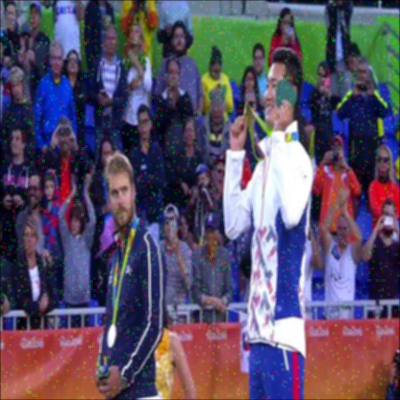

In [736]:
# Define the kernel size for the mean filter
kernel_size = 3  # 3x3 kernel

# Create an empty output image with the same dimensions as the input image
mfdenoised_image = np.copy(g_image1)

# Pad the image to handle border pixels
padded_image = cv2.copyMakeBorder(g_image1, 1, 1, 1, 1, cv2.BORDER_CONSTANT, value=(0, 0, 0))

# Iterate through the image to apply the mean filter to each color channel
for y in range(1, g_image1.shape[0] + 1):
    for x in range(1, g_image1.shape[1] + 1):
        for channel in range(3):  # 0 for Blue, 1 for Green, 2 for Red
            neighborhood = padded_image[y - 1:y + 2, x - 1:x + 2, channel]
            mean_value = np.sum(neighborhood) / (kernel_size ** 2)
            mfdenoised_image[y - 1, x - 1, channel] = int(mean_value)

# Display the original and mean-filtered color images
cv2_imshow(g_image1)
cv2_imshow(mfdenoised_image)

In [737]:
## mean filter value
mean_value

5.777777777777778

In [738]:
neighborhood

array([[12, 16,  0],
       [10, 14,  0],
       [ 0,  0,  0]], dtype=uint8)

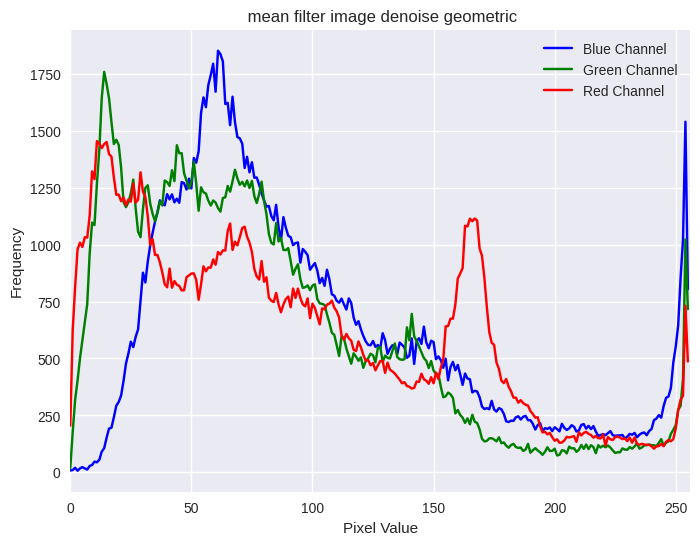

In [739]:
## plot mean filter plot for denoised image
b, g, r = cv2.split(mfdenoised_image)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" mean filter image denoise geometric")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [740]:
# Calculate the mean and variance of the mean filtered  denoised image
mfmean = np.mean(mfdenoised_image)
mfvariance = np.var(mfdenoised_image)
mfmedian=np.median(mfdenoised_image)

# Display the mean and variance
print("Mean:", mfmean)
print("Variance:", mfvariance)
print("median",mfmedian)

Mean: 90.22485625
Variance: 3768.4234500835028
median 76.0


**Image Sharpening with various Mean**

In [741]:
##IMage Sharpning with various means

In [742]:
##Arethmetic mean

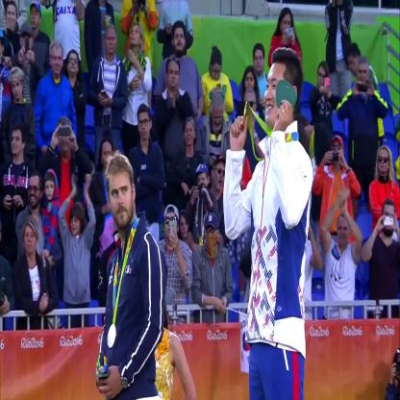

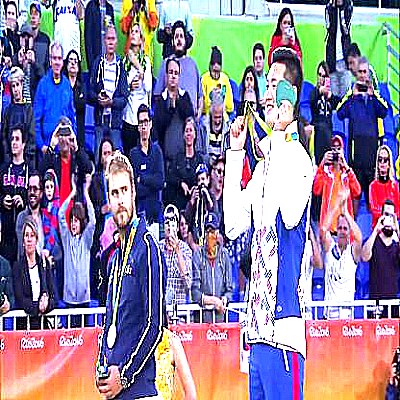

In [743]:
# Define the sharpening kernel (3x3)
kernel = np.array([[-1, -1, -1],
                  [-1,  10, -1],
                  [-1, -1, -1]])

# Apply the convolution operation
sharpened_image1 = cv2.filter2D(image1, -1, kernel)

# Display the original and sharpened images
cv2_imshow(image1)
cv2_imshow(sharpened_image1)

In [744]:
# Calculate the mean and variance of the Arethmetic sharpening
amean = np.mean(sharpened_image1)
avariance = np.var(sharpened_image1)
amedian=np.median(sharpened_image1)

# Display the mean and variance
print("Mean:", amean)
print("Variance:", avariance)
print("median",amedian)

Mean: 141.20868958333332
Variance: 8926.788509074473
median 138.0


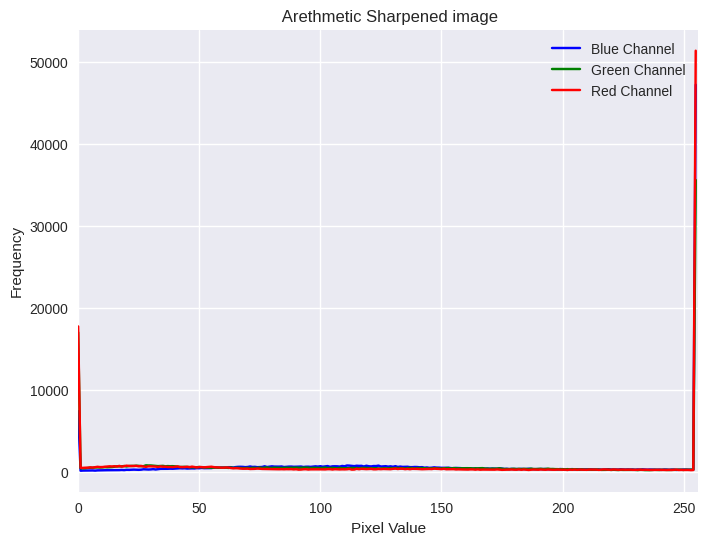

In [745]:
b, g, r = cv2.split(sharpened_image1)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" Arethmetic Sharpened image")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [746]:
## weighted sharpening

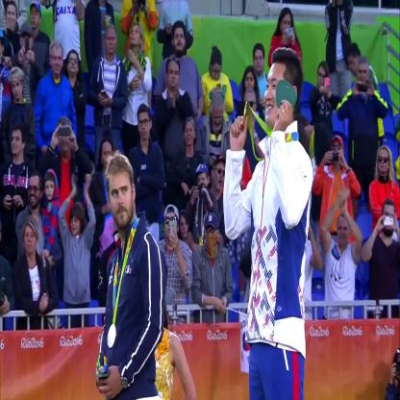

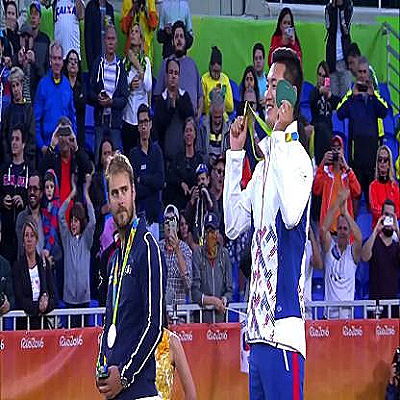

In [747]:
# Define the sharpening kernel (3x3) with different weights
kernel = np.array([[0, -1, 0],
                  [-1, 5, -1],
                  [0, -1, 0]])
# Split the color image into its three color channels (B, G, R)
b, g, r = cv2.split(image1)

# Apply the convolution operation to each channel
sharpened_b = cv2.filter2D(b, -1, kernel)
sharpened_g = cv2.filter2D(g, -1, kernel)
sharpened_r = cv2.filter2D(r, -1, kernel)

# Merge the sharpened color channels back into a color image
sharpened_imagew = cv2.merge((sharpened_b, sharpened_g, sharpened_r))

# Display the original and sharpened color images
cv2_imshow(image1)
cv2_imshow(sharpened_imagew)

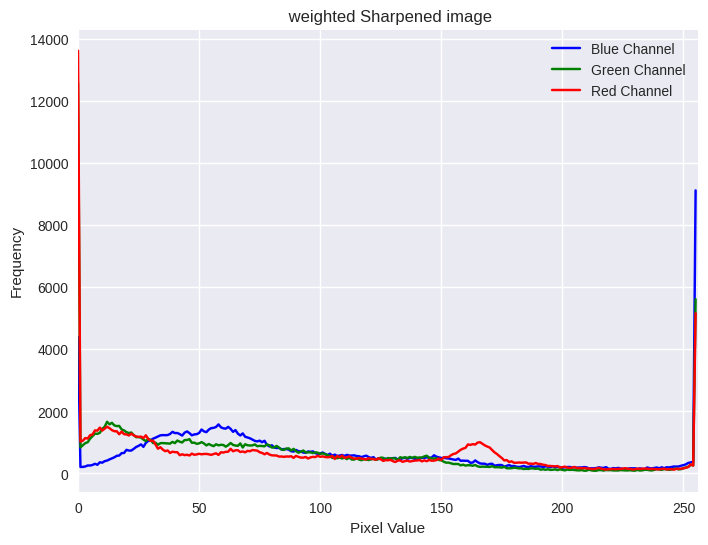

In [748]:
b, g, r = cv2.split(sharpened_imagew)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" weighted Sharpened image")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [749]:
# Calculate the mean and variance of weighted sharpening
wsmean = np.mean(sharpened_imagew)
wsvariance = np.var(sharpened_imagew)
wsmedian=np.median(sharpened_imagew)

# Display the mean and variance
print("Mean:", wsmean)
print("Variance:", wsvariance)
print("median",wsmedian)

Mean: 87.65299791666666
Variance: 5131.013870804164
median 70.0


In [750]:
## Geometric sharpened

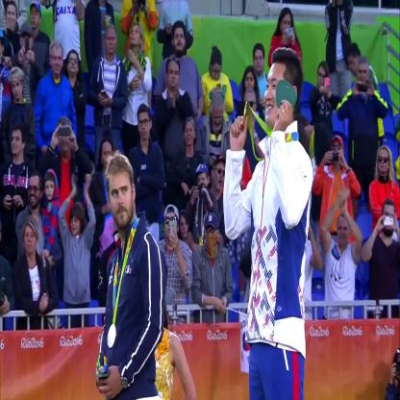

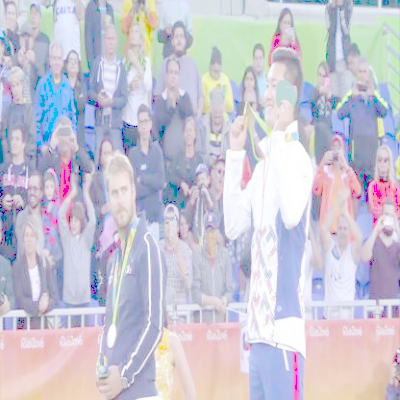

In [751]:
# Define the size of the filter kernel (e.g., 3x3)
kernel_size = 3
exponent=1.5

# Initialize the sharpened image
gssharpened_image = np.copy(image1)
# Iterate through each color channel (B, G, R)
# Iterate through each color channel (B, G, R)
for channel in range(3):
    # Extract the channel
    channel_image = image1[:, :, channel]

    # Apply the geometric mean filter to the channel while preserving brightness
    gssharpened_channel = cv2.pow(channel_image / 255.0, 1 / (kernel_size ** 2))**exponent * 255.0

    # Update the sharpened image with the sharpened channel
    gssharpened_image[:, :, channel] = gssharpened_channel

# Convert the sharpened image back to 8-bit format
gssharpened_image = np.uint8(gssharpened_image)


# Display the original and sharpened color images
cv2_imshow(image1)
cv2_imshow(gssharpened_image)

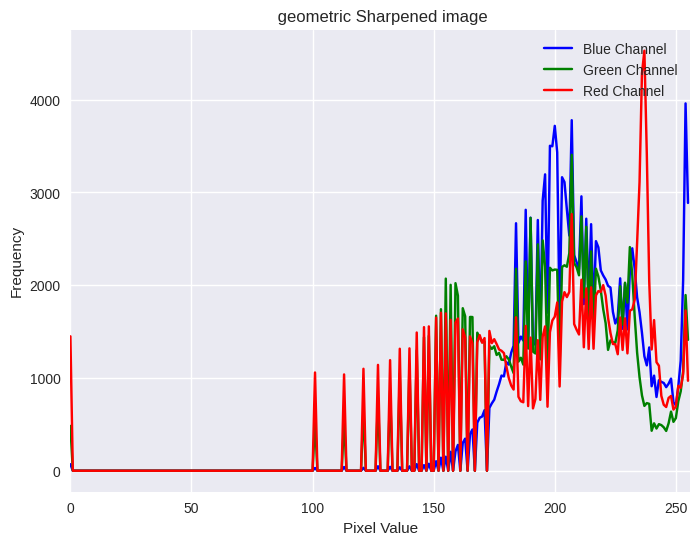

In [752]:
b, g, r = cv2.split(gssharpened_image)
# Create a histogram for each color channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Plot the histograms on a single figure
plt.figure(figsize=(8, 6))
plt.title(" geometric Sharpened image")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])

plt.plot(hist_b, color="blue", label="Blue Channel", alpha=1)
plt.plot(hist_g, color="green", label="Green Channel", alpha=1)
plt.plot(hist_r, color="red", label="Red Channel", alpha=1)

plt.legend(loc="upper right")
plt.grid(True)
plt.xticks(range(0, 256, 50))


plt.show()

In [753]:
# Calculate the mean and variance of the geometric sharpening
gsmean = np.mean(gssharpened_image)
gsvariance = np.var(gssharpened_image)
gsmedian=np.median(gssharpened_image)

# Display the mean and variance
print("Mean:", gsmean)
print("Variance:", gsvariance)
print("median",gsmedian)

Mean: 202.95054166666668
Variance: 1063.783716373264
median 206.0


In [754]:
## Mean Filter sharpened

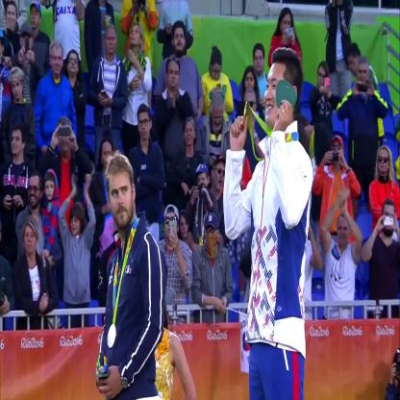

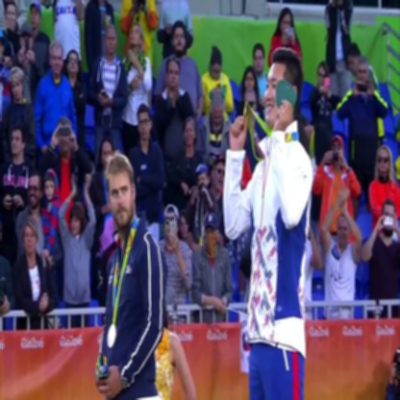

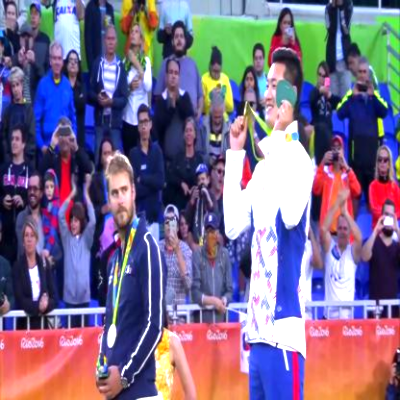

In [755]:
# Define the size of the filter kernel (e.g., 3x3)
kernel_size = 3

# Create a kernel with all ones
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)

# Apply the mean filter to the image
mean_filteredh = cv2.filter2D(image1, -1, kernel)
sharpening_amount=-0.5

# Sharpen the image by subtracting the mean filtered result from the original image
sharpened_imageh =np.clip(image1 - sharpening_amount*mean_filteredh, 0,256)

# Display the original, mean-filtered, and sharpened images
cv2_imshow(image1)
cv2_imshow(mean_filteredh)
cv2_imshow(sharpened_imageh)




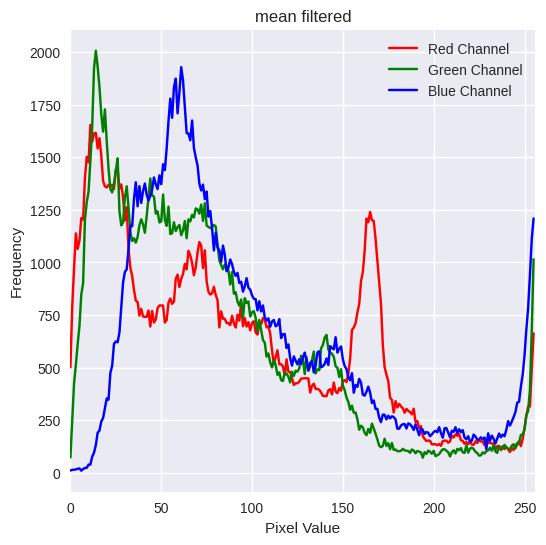

In [756]:
## Mean filtered plot
# Split the sharpened image into its three color channels (B, G, R)
b, g, r = cv2.split(mean_filteredh)
# Convert the color channels to 8-bit unsigned integers
r = np.uint8(r)
g = np.uint8(g)
b = np.uint8(b)

# Create histograms for the R, G, and B channels using matplotlib
plt.figure(figsize=(6, 6))

# Red channel histogram
plt.plot(cv2.calcHist([r], [0], None, [256], [0, 256]), color='red', label='Red Channel')
# Green channel histogram
plt.plot(cv2.calcHist([g], [0], None, [256], [0, 256]), color='green', label='Green Channel')
# Blue channel histogram
plt.plot(cv2.calcHist([b], [0], None, [256], [0, 256]), color='blue', label='Blue Channel')

plt.title('mean filtered')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])
plt.legend(loc='upper right')
plt.grid(True)

plt.show()

In [757]:
# Calculate the mean and variance of mean filtered
mmfmean = np.mean(mean_filteredh)
mmfvariance = np.var(mean_filteredh)
mmfmedian=np.median(mean_filteredh)

# Display the mean and variance
print("Mean:", mmfmean)
print("Variance:", mmfvariance)
print("median",mmfmedian)

Mean: 87.77310416666667
Variance: 3834.0396766141503
median 73.0


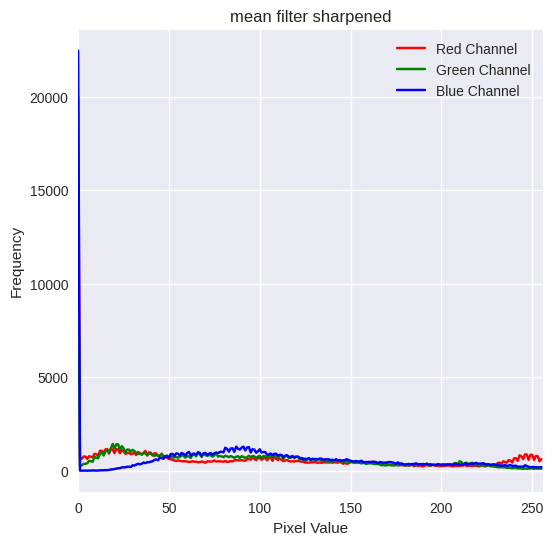

In [758]:
## plot for mean filtered sharpening
# Split the sharpened image into its three color channels (B, G, R)
b, g, r = cv2.split(sharpened_imageh)
# Convert the color channels to 8-bit unsigned integers
r = np.uint8(r)
g = np.uint8(g)
b = np.uint8(b)

# Create histograms for the R, G, and B channels using matplotlib
plt.figure(figsize=(6, 6))

# Red channel histogram
plt.plot(cv2.calcHist([r], [0], None, [256], [0, 256]), color='red', label='Red Channel')
# Green channel histogram
plt.plot(cv2.calcHist([g], [0], None, [256], [0, 256]), color='green', label='Green Channel')
# Blue channel histogram
plt.plot(cv2.calcHist([b], [0], None, [256], [0, 256]), color='blue', label='Blue Channel')

plt.title('mean filter sharpened')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])
plt.legend(loc='upper right')
plt.grid(True)

plt.show()







In [759]:
# Calculate the mean and variance of mean filtered sharpening
mmmean = np.mean(sharpened_imageh)
mmvariance = np.var(sharpened_imageh)
mmmedian=np.median(sharpened_imageh)

# Display the mean and variance
print("Mean:", mmmean)
print("Variance:", mmvariance)
print("median",mmmedian)

Mean: 123.92855208333333
Variance: 6253.237276445202
median 108.5


In [760]:
## Harmoniuc sharpening

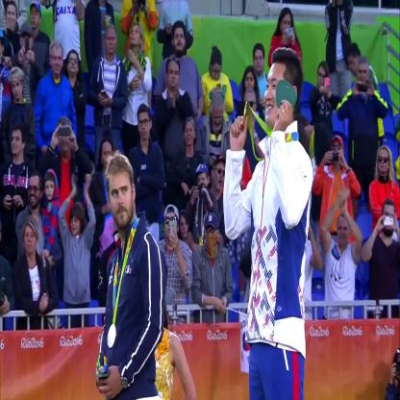

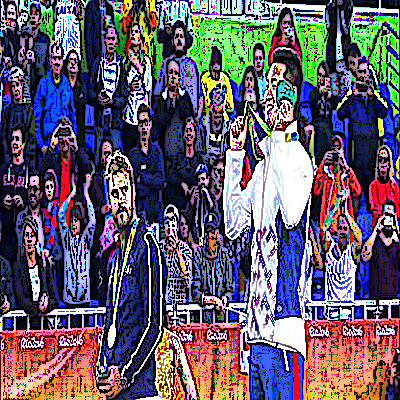

In [761]:
# Define the size of the filter kernel
kernel_size = 5

# Create a copy of the original color image
hsharpened_image = image1.copy()

# Iterate through the color channels (B, G, R) and apply harmonic sharpening
for channel in range(3):  # 0 for Blue, 1 for Green, 2 for Red
    channel_image = image1[:, :, channel]

    # Apply a low-pass filter (e.g., Gaussian blur) to the channel
    blurred_channel = cv2.GaussianBlur(channel_image, (kernel_size, kernel_size), 0)

    # Calculate the high-frequency components for the channel
    high_freq_channel = channel_image - blurred_channel

    # Add the high-frequency components back to the original channel
    hsharpened_channel = cv2.addWeighted(channel_image,2, high_freq_channel, -1, 0)

    # Replace the channel in the sharpened image with the sharpened channel
    hsharpened_image[:, :, channel] = hsharpened_channel

# Display the original and sharpened color images
cv2_imshow( image1)
cv2_imshow(hsharpened_image)

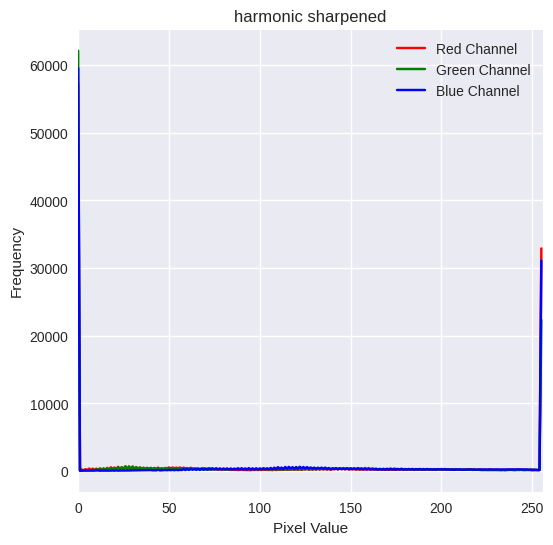

In [762]:
# Split the sharpened image into its three color channels (B, G, R)
b, g, r = cv2.split(hsharpened_image)
# Convert the color channels to 8-bit unsigned integers
r = np.uint8(r)
g = np.uint8(g)
b = np.uint8(b)

# Create histograms for the R, G, and B channels using matplotlib
plt.figure(figsize=(6, 6))

# Red channel histogram
plt.plot(cv2.calcHist([r], [0], None, [256], [0, 256]), color='red', label='Red Channel')
# Green channel histogram
plt.plot(cv2.calcHist([g], [0], None, [256], [0, 256]), color='green', label='Green Channel')
# Blue channel histogram
plt.plot(cv2.calcHist([b], [0], None, [256], [0, 256]), color='blue', label='Blue Channel')

plt.title('harmonic sharpened')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])
plt.legend(loc='upper right')
plt.grid(True)

plt.show()

In [763]:
# Calculate the mean and variance of harmonic sharpening
mean = np.mean(hsharpened_image)
variance = np.var(hsharpened_image)
median=np.median(hsharpened_image)

# Display the mean and variance
print("Mean:", mean)
print("Variance:", variance)
print("median",median)

Mean: 100.46326458333333
Variance: 10374.36738800916
median 70.0


In [764]:
# Calculate the mean and variance of the original image
mean = np.mean(image1)
variance = np.var(image1)
median=np.median(image1)

# Display the mean and variance
print("Mean:", mean)
print("Variance:", variance)
print("median",median)

Mean: 87.76601875
Variance: 4095.838392357981
median 72.0


**Explain the major difference between your results**

In [765]:
## Answer is in power point slide

In [766]:
## All other answers are in slides or pdf